In [23]:
from casatools import table
tb = table()

In [24]:
ls -lhrtd *cal

drwxr-xr-x 7 adamginsburg adamginsburg 4.0K Jun  2 11:27 w51n_b3_selfcal_phase0_T.cal/
drwxr-xr-x 7 adamginsburg adamginsburg 4.0K Jun  2 14:14 w51n_b3_selfcal_phase1_T.cal/
drwxr-xr-x 7 adamginsburg adamginsburg 4.0K Jun  2 17:52 w51n_b3_selfcal_phase2_T.cal/
drwxr-xr-x 7 adamginsburg adamginsburg 4.0K Jun  2 20:23 w51n_b3_startmodselfcal_phase0_T.startmod.cal/
drwxr-xr-x 7 adamginsburg adamginsburg 4.0K Jun  2 21:10 w51e2_b3_selfcal_phase0_T.cal/
drwxr-xr-x 7 adamginsburg adamginsburg 4.0K Jun  2 21:24 w51e2_b3_startmodselfcal_phase0_T.startmod.cal/
drwxr-xr-x 7 adamginsburg adamginsburg 4.0K Jun  2 22:31 w51n_b3_selfcal_phase3_T.cal/
drwxr-xr-x 7 adamginsburg adamginsburg 4.0K Jun  3 00:12 w51n_b3_startmodselfcal_phase1_T.startmod.cal/
drwxr-xr-x 7 adamginsburg adamginsburg 4.0K Jun  3 02:27 w51e2_b3_startmodselfcal_phase1_T.startmod.cal/
drwxr-xr-x 7 adamginsburg adamginsburg 4.0K Jun  3 03:09 w51n_b3_selfcal_phase4_T.cal/
drwxr-xr-x 7 adamginsburg adamginsburg 4.0K Jun  3 03:28 w5

In [25]:
tb.open('w51n_b3_selfcal_phase1_T.cal')
data = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()

True

In [26]:
%matplotlib inline
import pylab as pl
pl.style.use('dark_background')

In [58]:
import warnings

def plotcal(fid=0, spwids=[0], figsize = (20,12), nx=6, ny=4, data=None, ylim=None):
    OK = data['SNR'] != 0
    data['ANGLE'] = np.angle(data['CPARAM'])
    nant = len(np.unique(data['ANTENNA1']))
    mod = nx * ny
    for pol in (0,):
        pl.figure(figsize=figsize)
        cnt = 0

        for ii,ant in enumerate(np.unique(data['ANTENNA1'])):

            msk = (data['ANTENNA1'] == ant) & (data['FIELD_ID'] == fid) & (OK[pol,0,:])
            if np.any(msk):
                with warnings.catch_warnings():
                    warnings.simplefilter("ignore")
                    ax = pl.subplot(ny, nx, (cnt%mod)+1)

                for spwid in spwids:
                    msk = (data['ANTENNA1'] == ant) & (data['FIELD_ID'] == fid) & (OK[pol,0,:]) & (data['SPECTRAL_WINDOW_ID'] == spwid)
                    with warnings.catch_warnings():
                        warnings.simplefilter("ignore")
                        snr = np.nanmedian(data['SNR'][0,0,msk])
                    if any(msk):
                        ax.plot((data['TIME'][msk]-data['TIME'][msk][0])/60,
                                   data['ANGLE'][pol,0,msk]*180/np.pi, linewidth=1,
                                label=f'{snr:0.1f}'
                               )
                if ylim is not None:
                    ax.set_ylim(*ylim)
                ax.set_title(str(ant))
                pl.legend(loc='best',)
                cnt += 1
                if cnt % mod == 0:
                    pl.figure(figsize=figsize)

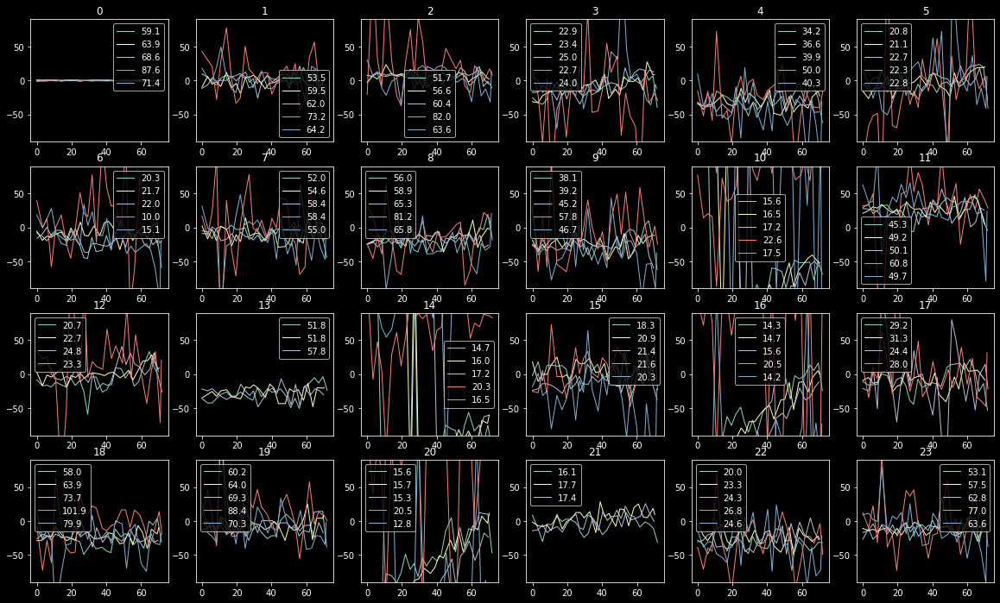

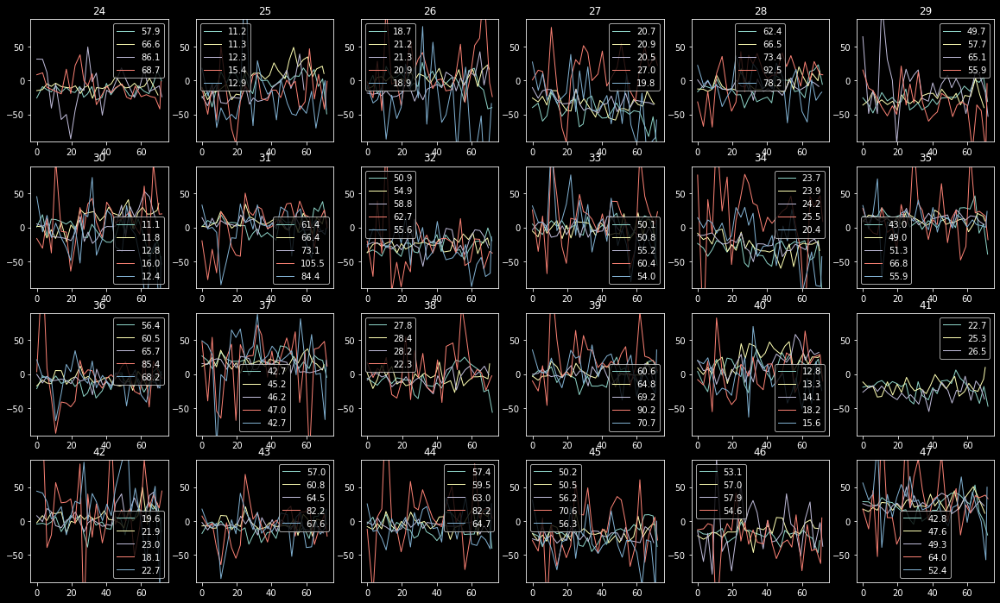

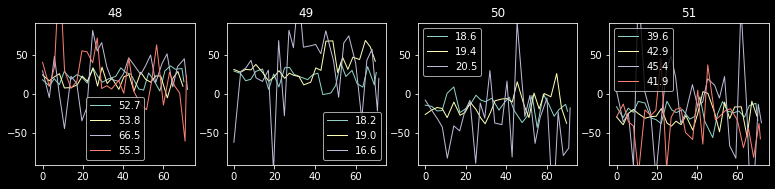

In [74]:
tb.open('w51e2_b3_selfcal_phase0_T.cal')
data_e2_0 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()
plotcal(spwids=[0,4,8,12,16], ylim=(-90,90), data=data_e2_0)

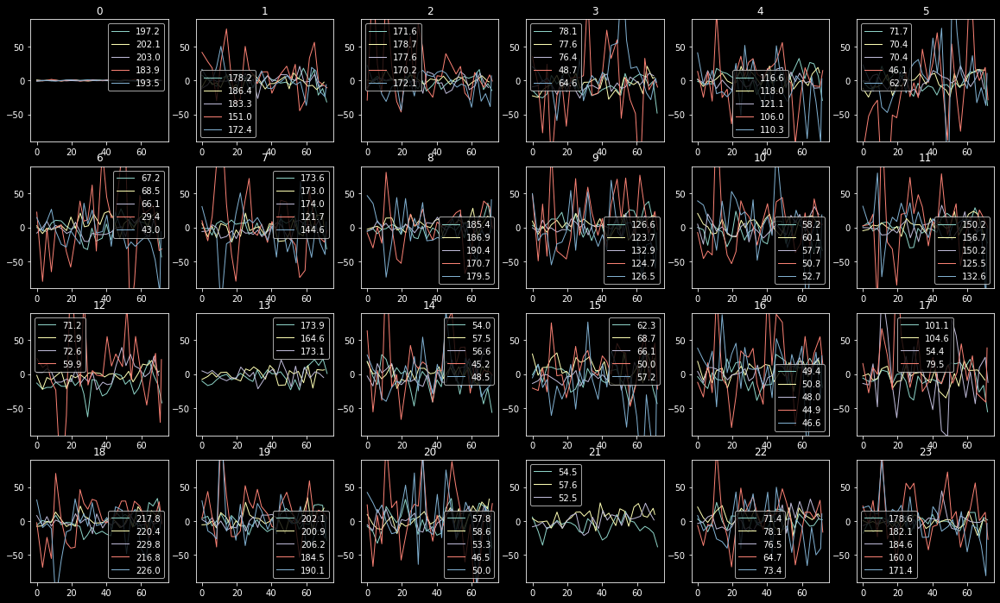

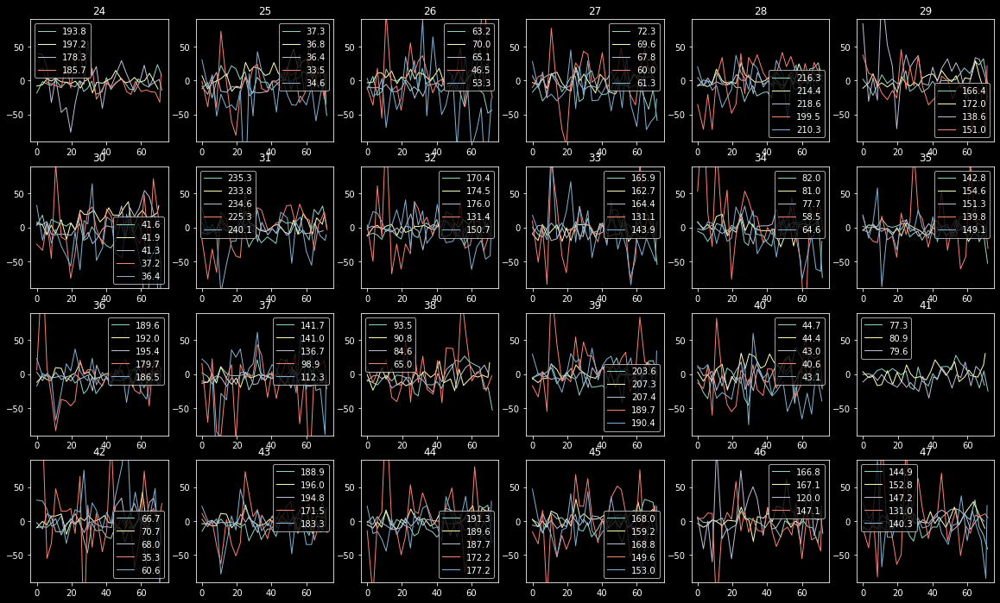

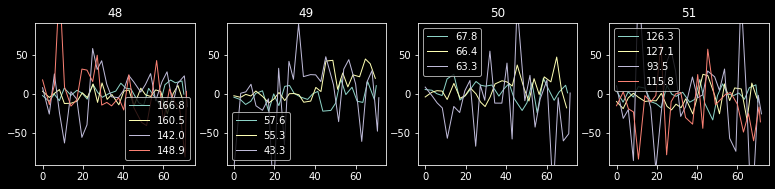

In [75]:
tb.open('w51e2_b3_startmodselfcal_phase0_T.startmod.cal')
data_e2_0 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()
plotcal(spwids=[0,4,8,12,16], ylim=(-90,90), data=data_e2_0)

In [76]:
tb.open('w51e2_b3_selfcal_phase1_T.cal')
data_e2_1 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()

True

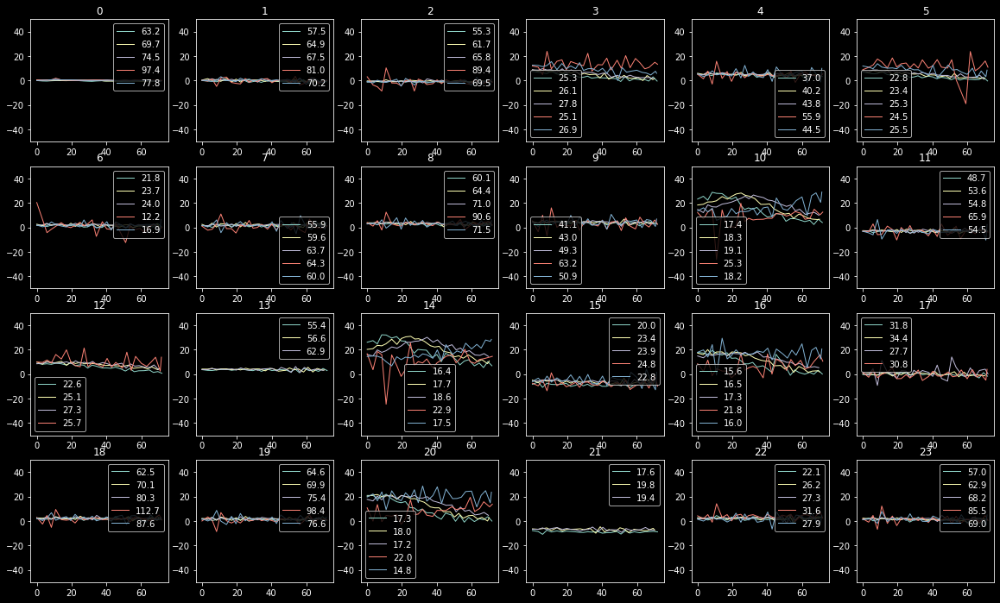

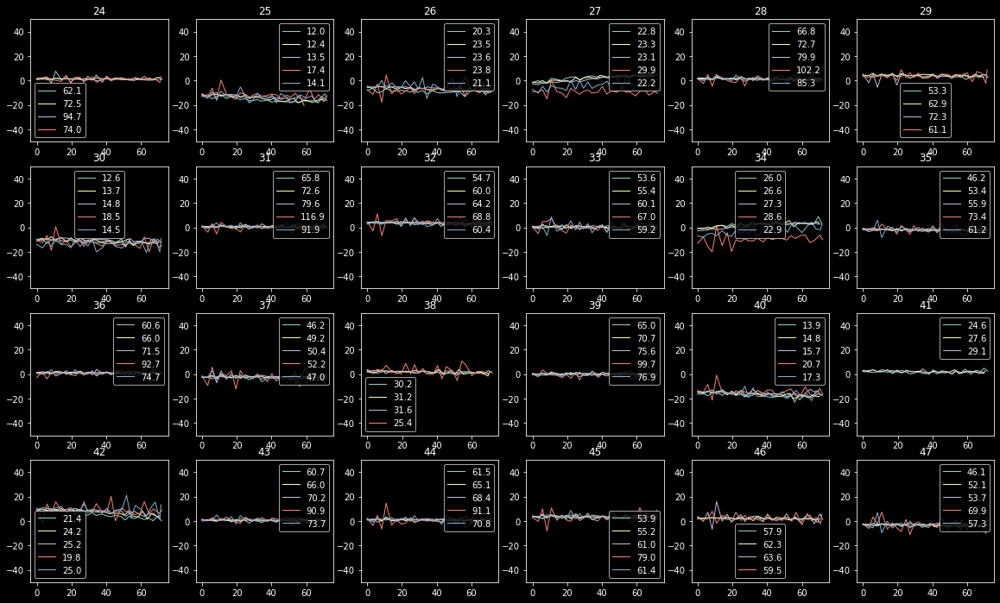

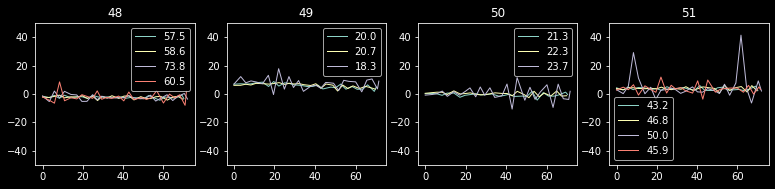

In [77]:
plotcal(spwids=[0,4,8,12,16], ylim=(-50,50), data=data_e2_1)

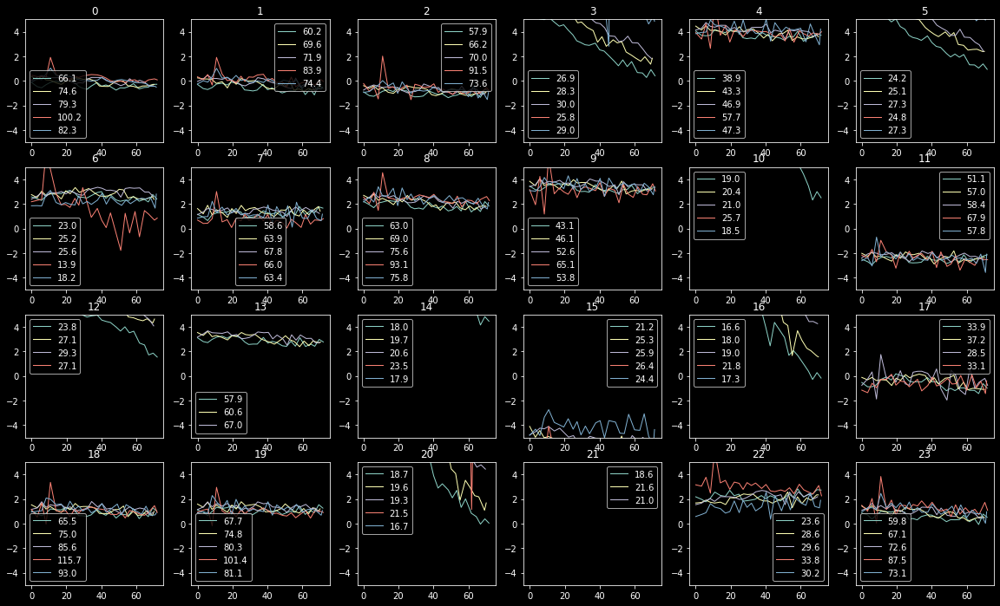

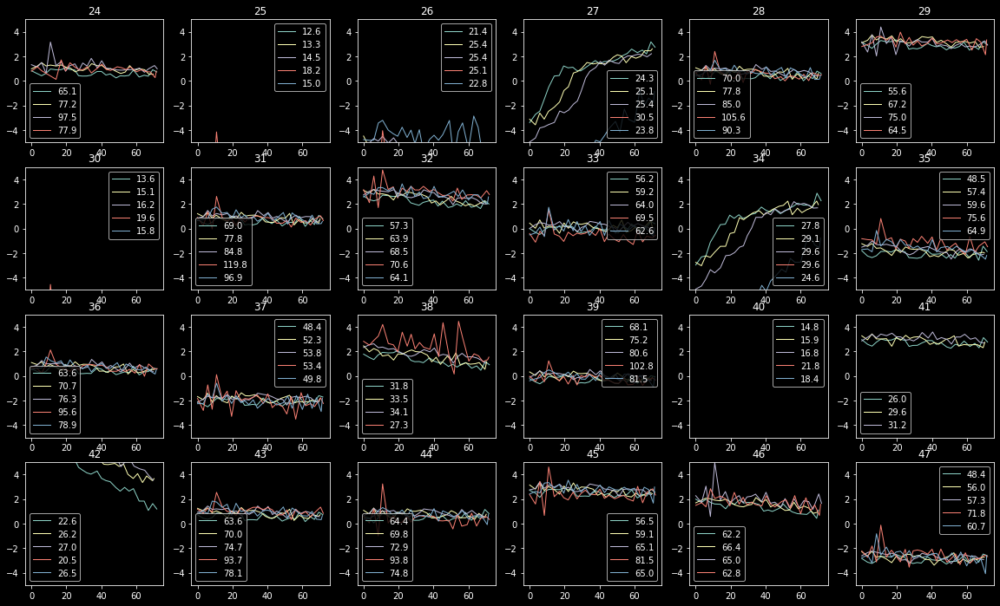

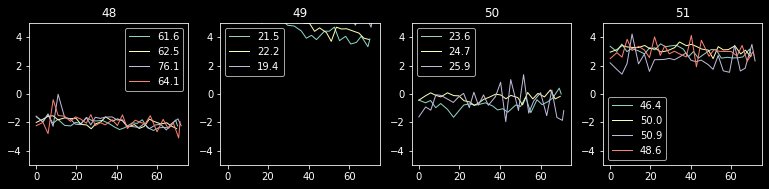

In [78]:
tb.open('w51e2_b3_selfcal_phase2_T.cal')
data_e2_2 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()
plotcal(spwids=[0,4,8,12,16], ylim=(-5,5), data=data_e2_2)

tb.open('w51e2_b3_selfcal_phase3_T.cal')
data_e2_3 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()
plotcal(spwids=[0,4,8,12,16], ylim=(-5,5), data=data_e2_3)

In [ ]:
tb.open('w51e2_b3_selfcal_phase4_T_int.cal')
data_e2_4 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()

In [ ]:
plotcal(spwids=[0,4,8,12,16], ylim=(-35,35), data=data_e2_4)

In [ ]:
tb.open('w51e2_b3_selfcal_phase5_T_int.cal')
data_e2_5 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()

In [ ]:
plotcal(spwids=[0,4,8,12,16], ylim=(-35,35), data=data_e2_5)

In [41]:
tb.open('w51n_b3_selfcal_phase0_T.cal')
data_n_0 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()

True

In [ ]:
plotcal(spwids=[0,4,8,12,16], ylim=(-90,90), data=data_n_0)

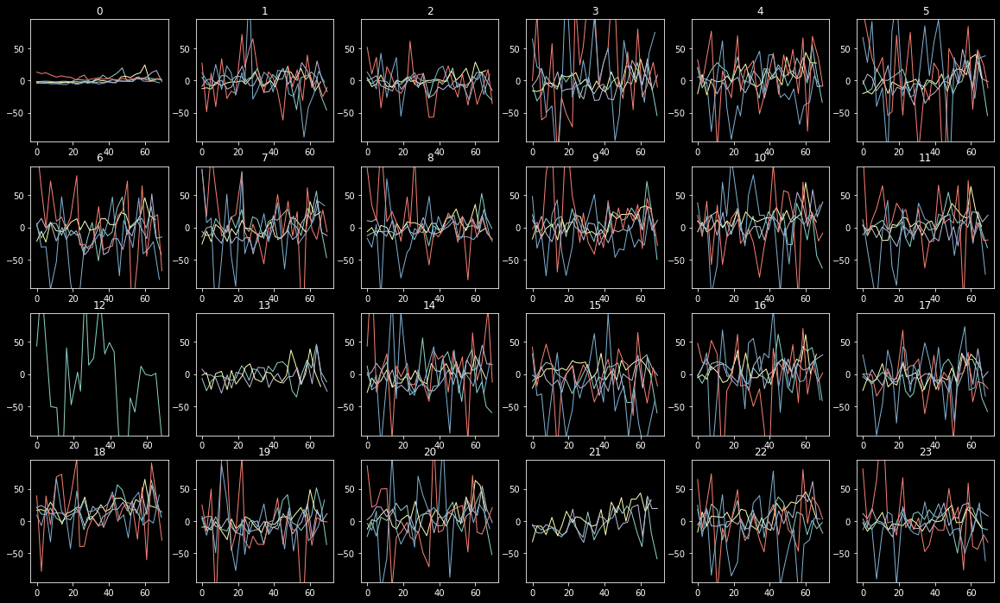

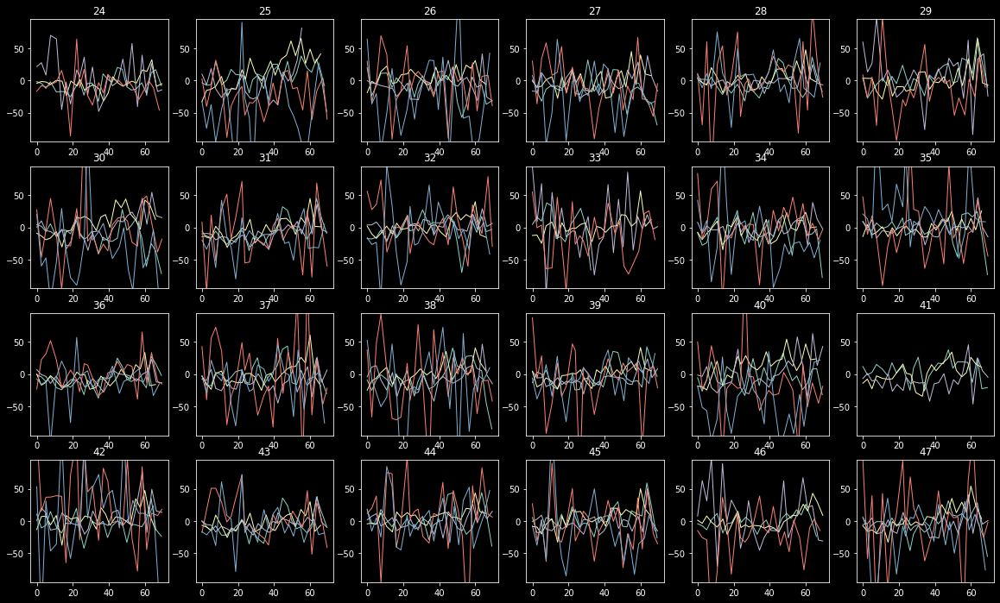

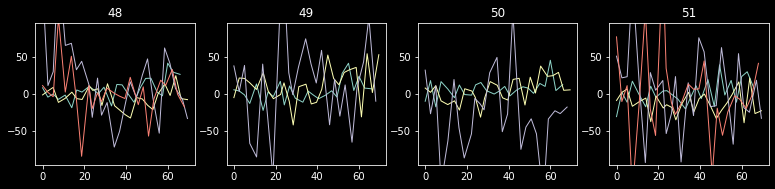

In [43]:
plotcal(spwids=[3,7,11,15,19], ylim=(-95,95), data=data_n_0)

In [44]:
tb.open('w51n_b3_selfcal_phase1_T.cal')
data_n_1 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()

True

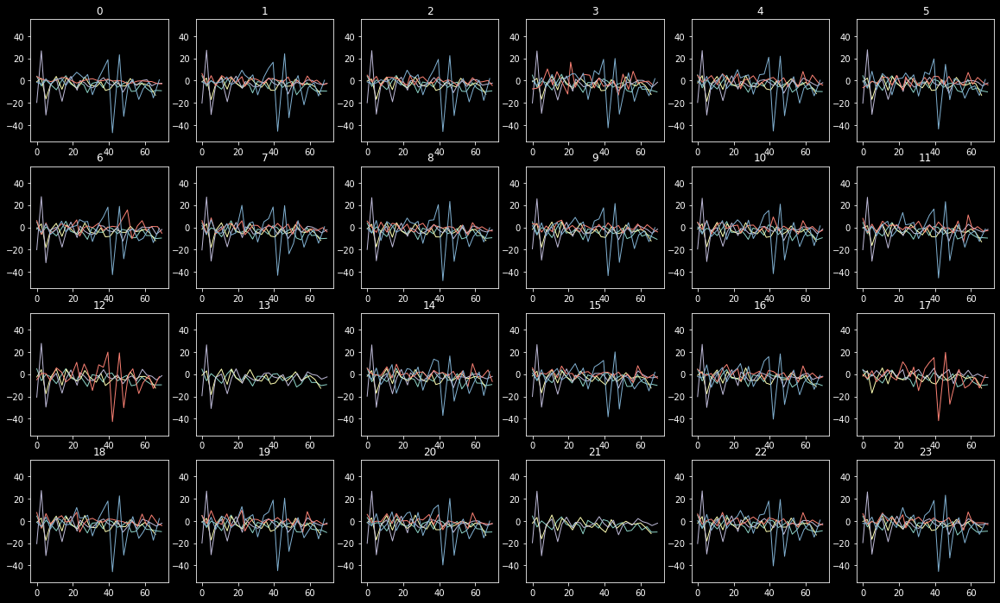

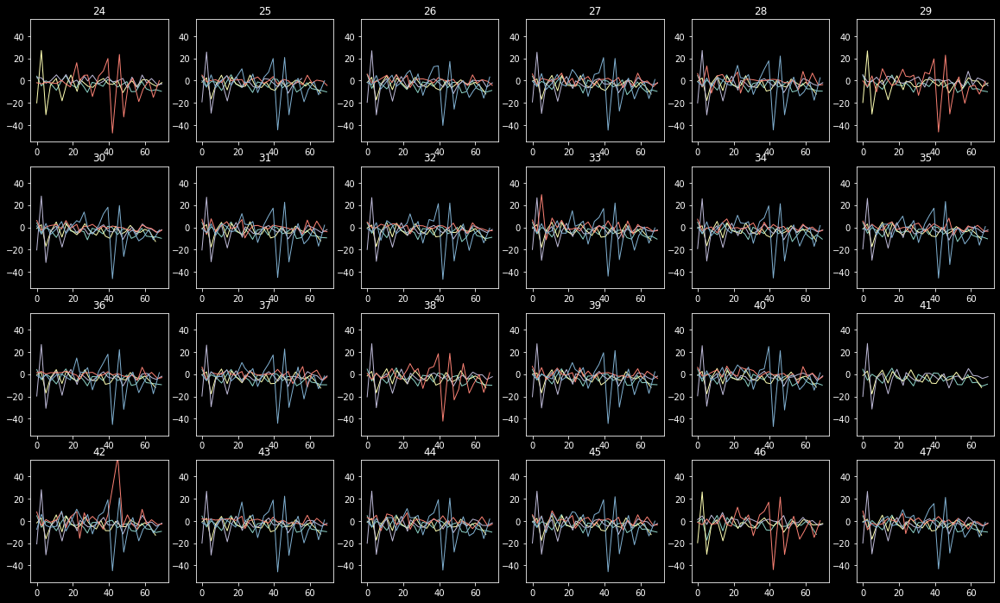

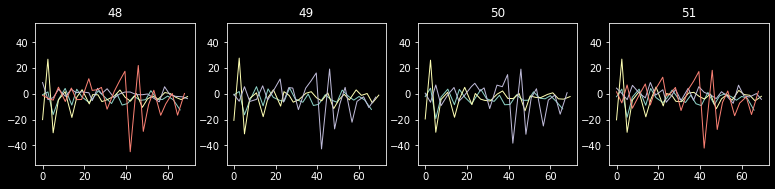

In [45]:
plotcal(spwids=[0,4,8,12,16], ylim=(-55,55), data=data_n_1)

In [46]:
tb.open('w51n_b3_selfcal_phase2_T.cal')
data_n_2 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()

True

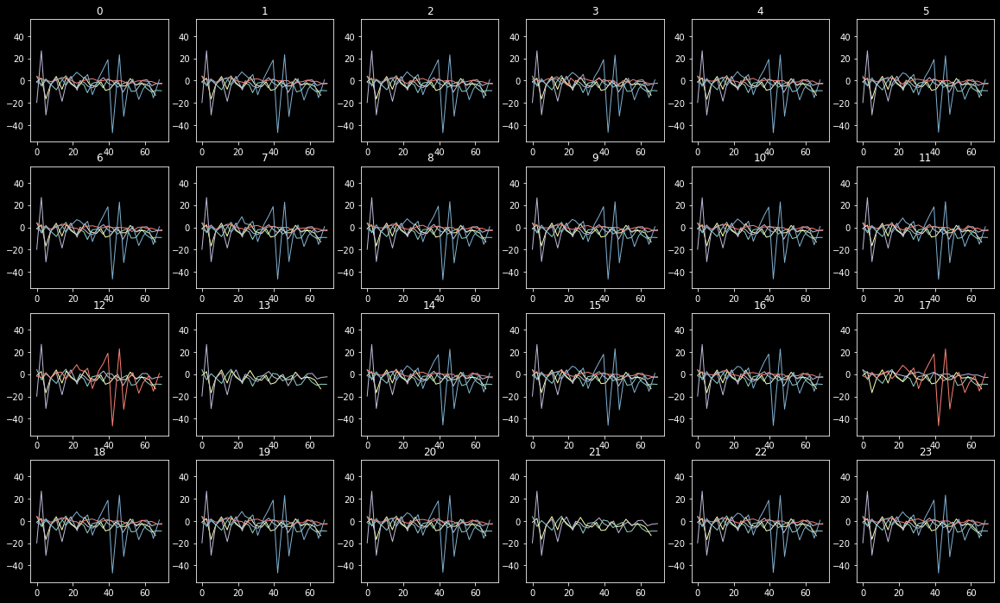

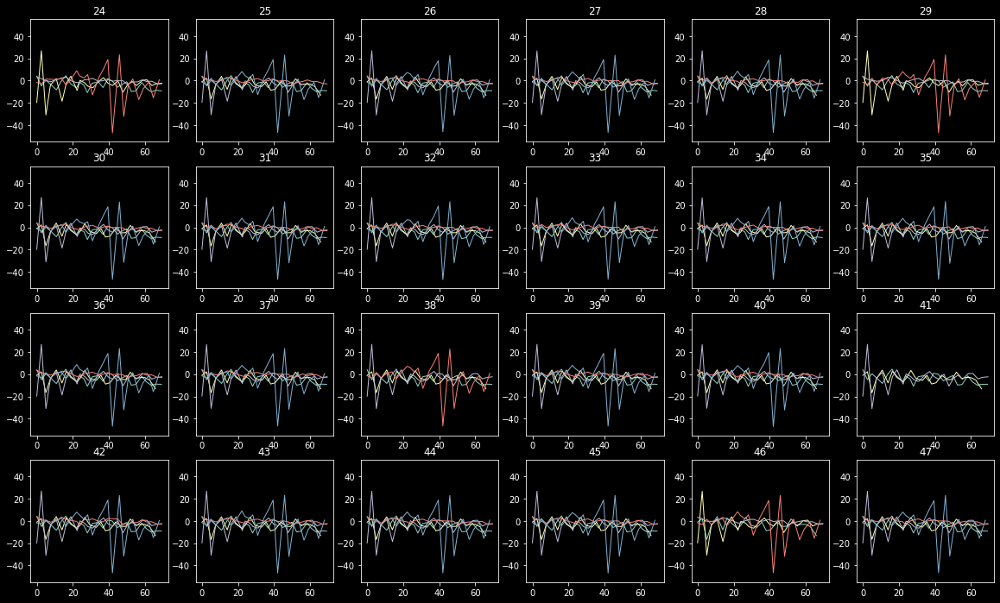

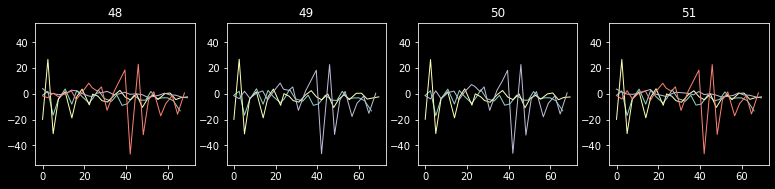

In [47]:
plotcal(spwids=[0,4,8,12,16], ylim=(-55,55), data=data_n_2)

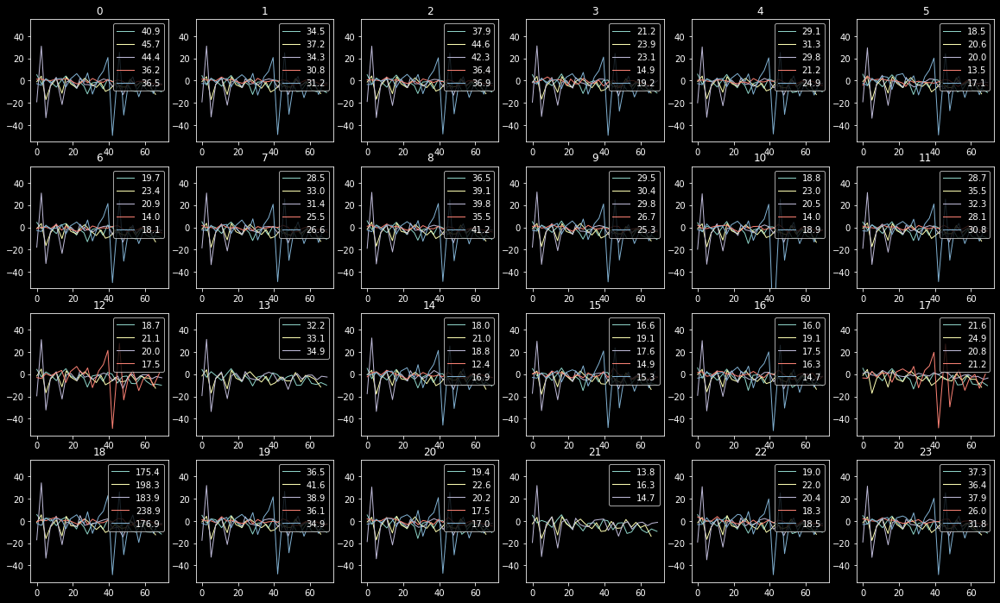

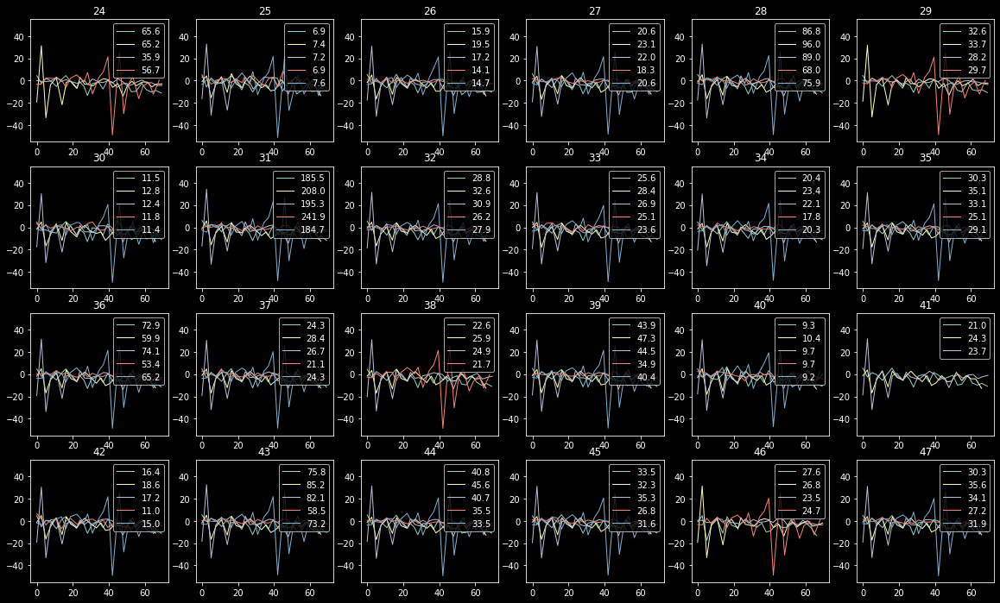

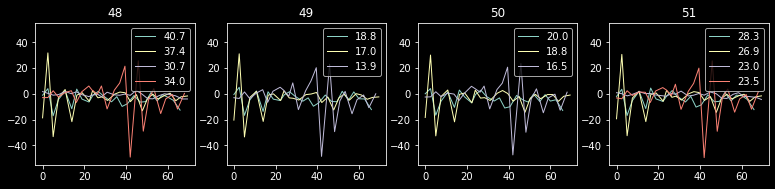

In [61]:
tb.open('w51n_b3_selfcal_phase3_T.cal')
data_n_3 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()
plotcal(spwids=[0,4,8,12,16], ylim=(-55,55), data=data_n_3)

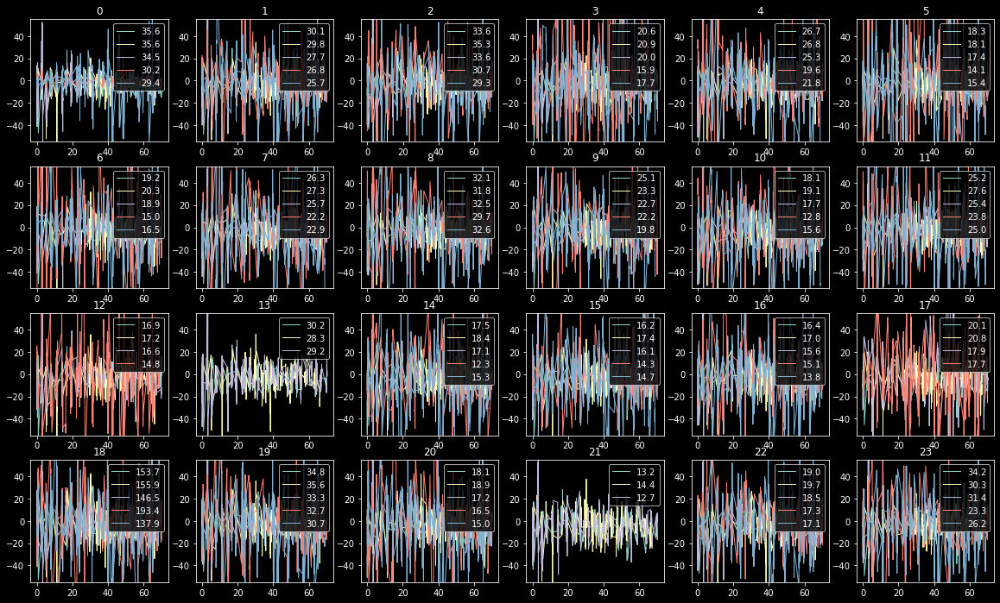

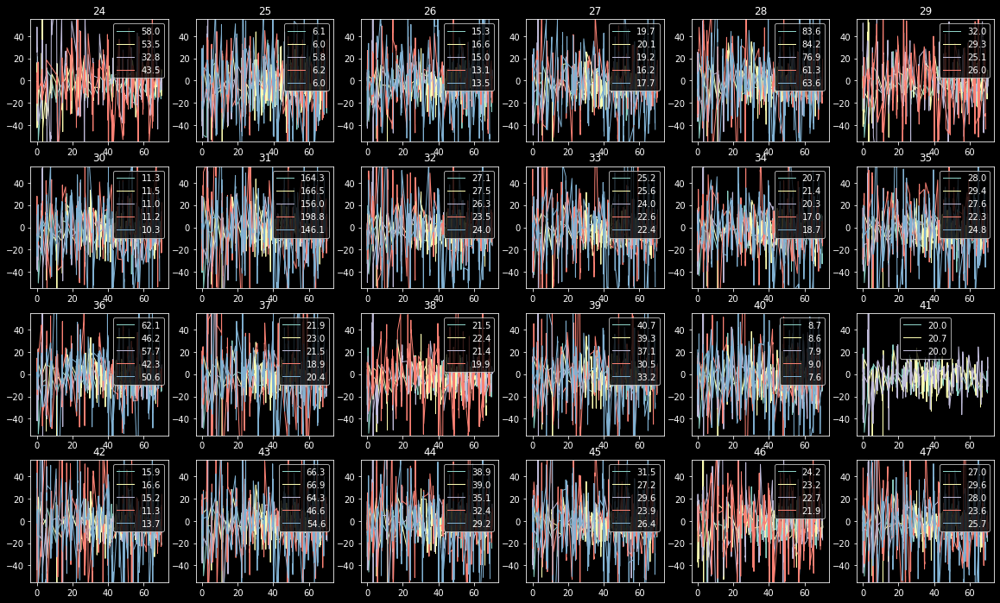

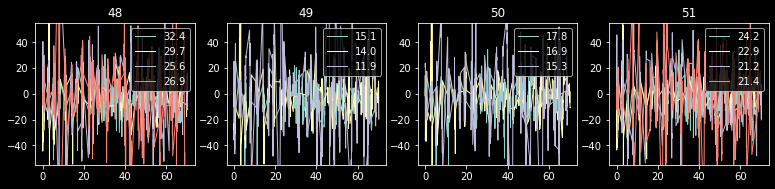

In [62]:
tb.open('w51n_b3_selfcal_phase4_T.cal')
data_n_4 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()
plotcal(spwids=[0,4,8,12,16], ylim=(-55,55), data=data_n_4)

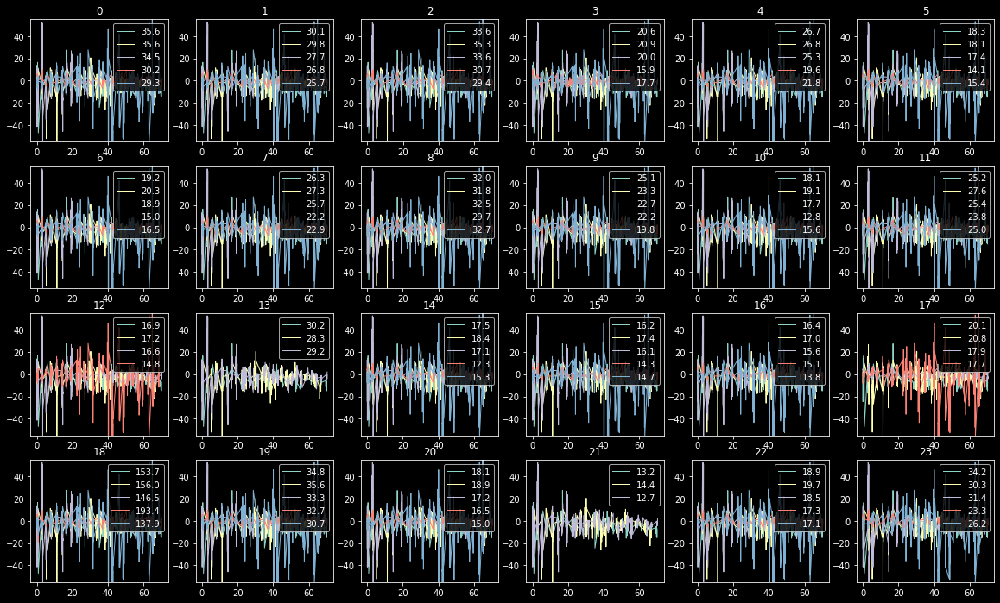

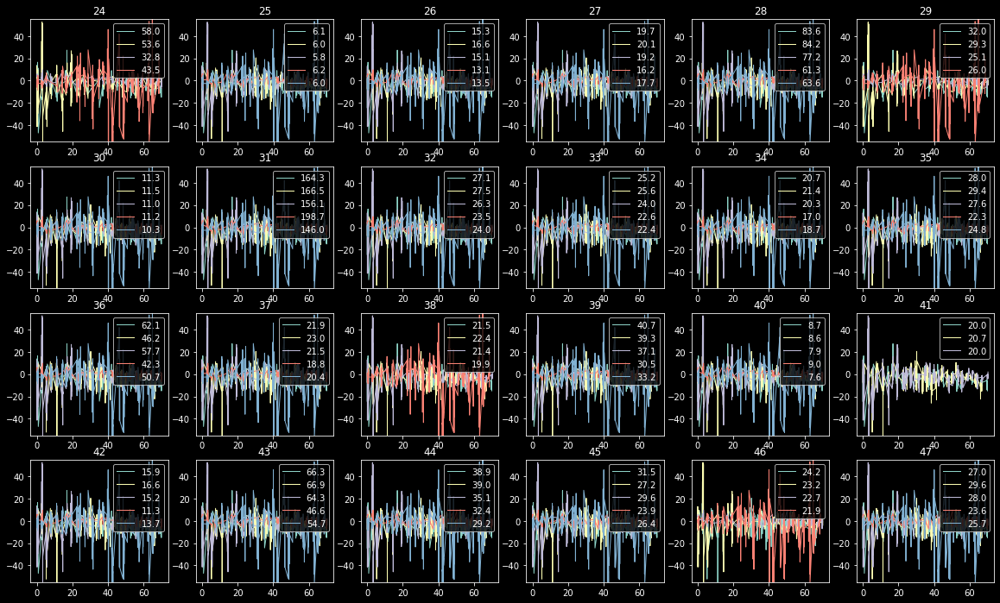

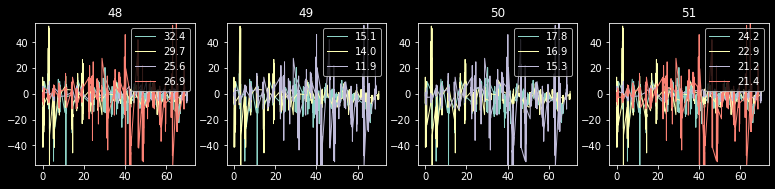

In [63]:
tb.open('w51n_b3_selfcal_phase5_T.cal')
data_n_5 = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()
plotcal(spwids=[0,4,8,12,16], ylim=(-55,55), data=data_n_5)

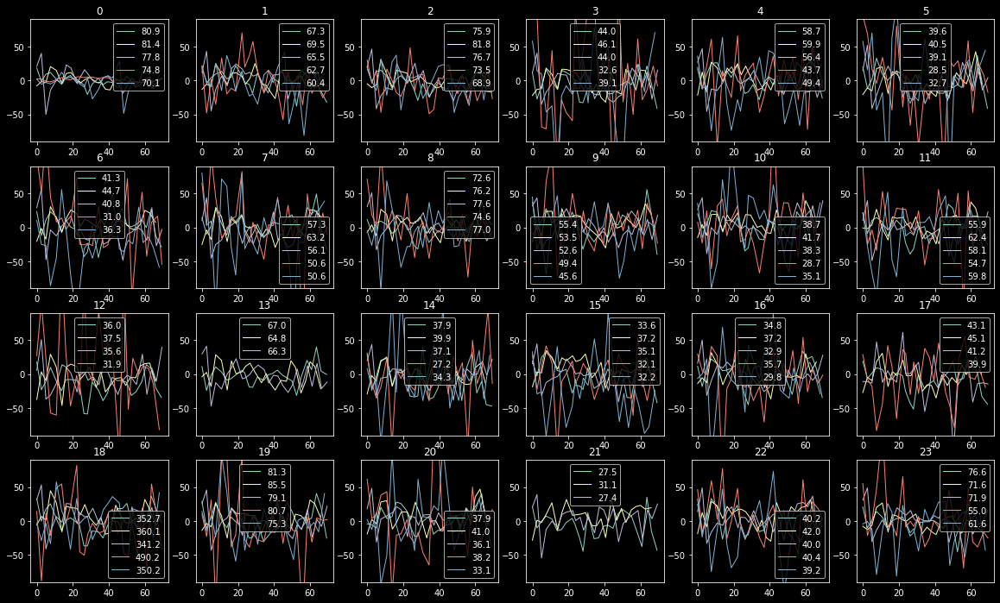

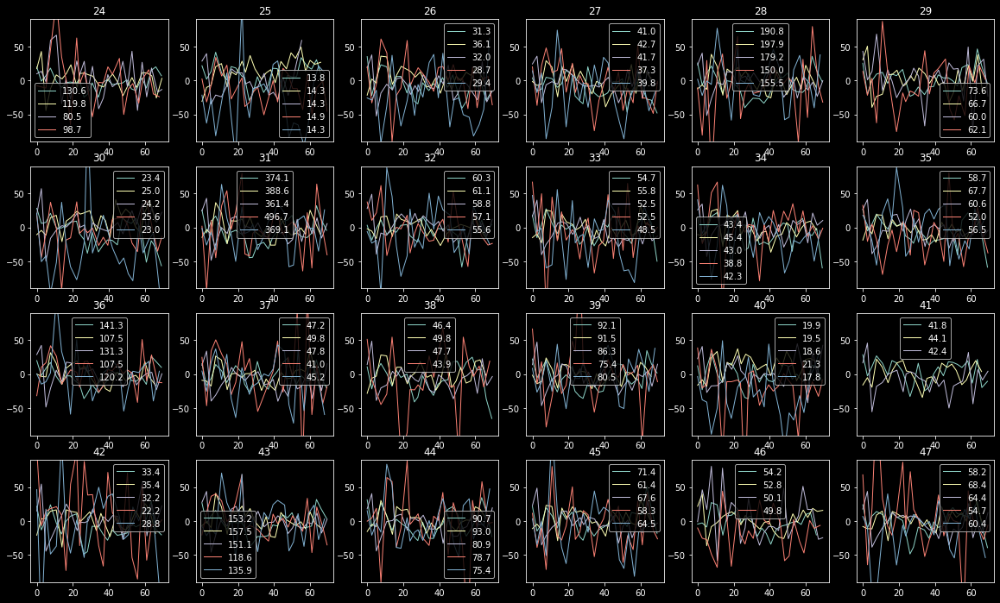

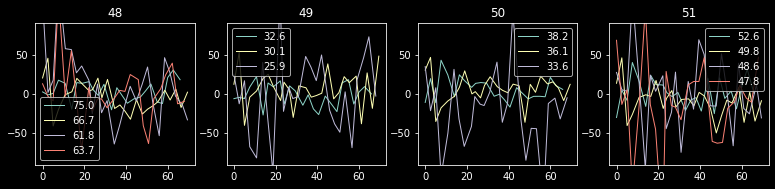

In [68]:
tb.open('w51n_b3_startmodselfcal_phase0_T.startmod.cal')
data_n_0_sm = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()
plotcal(spwids=[0,4,8,12,16], ylim=(-90,90), data=data_n_0_sm)

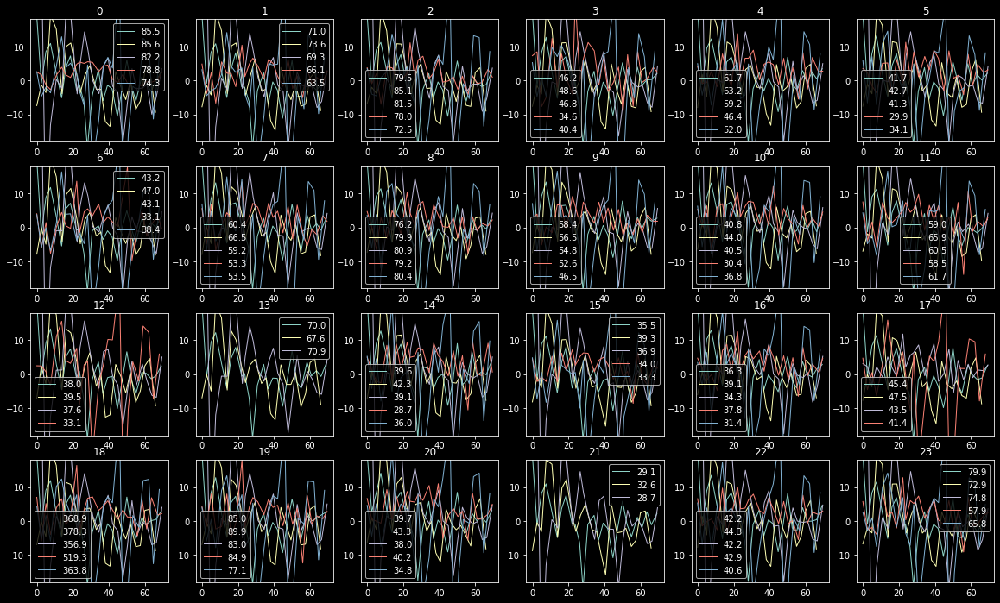

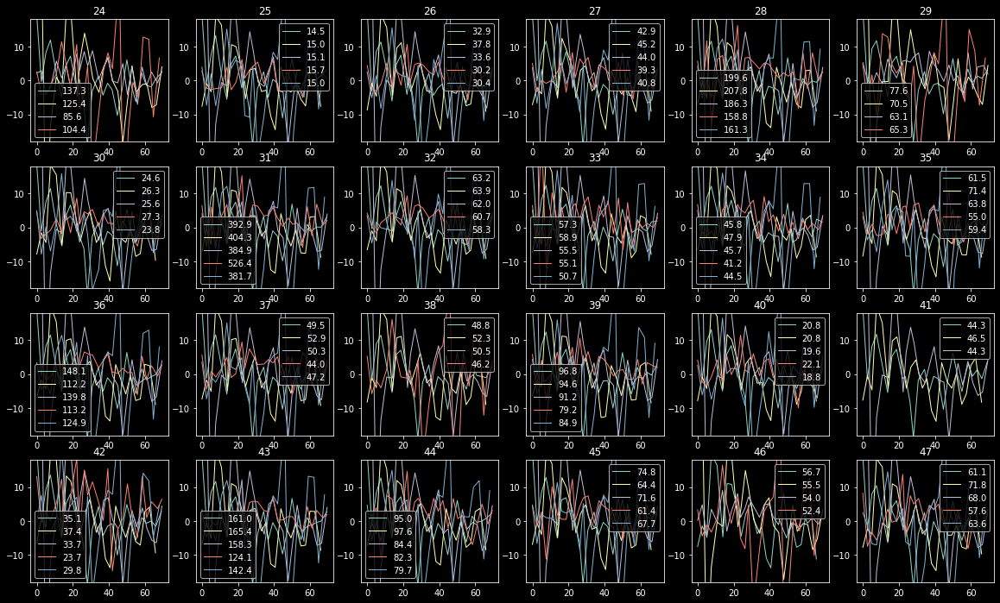

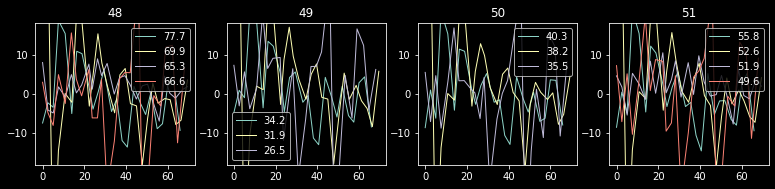

In [66]:
tb.open('w51n_b3_startmodselfcal_phase1_T.startmod.cal')
data_n_1_sm = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()
plotcal(spwids=[0,4,8,12,16], ylim=(-18,18), data=data_n_1_sm)

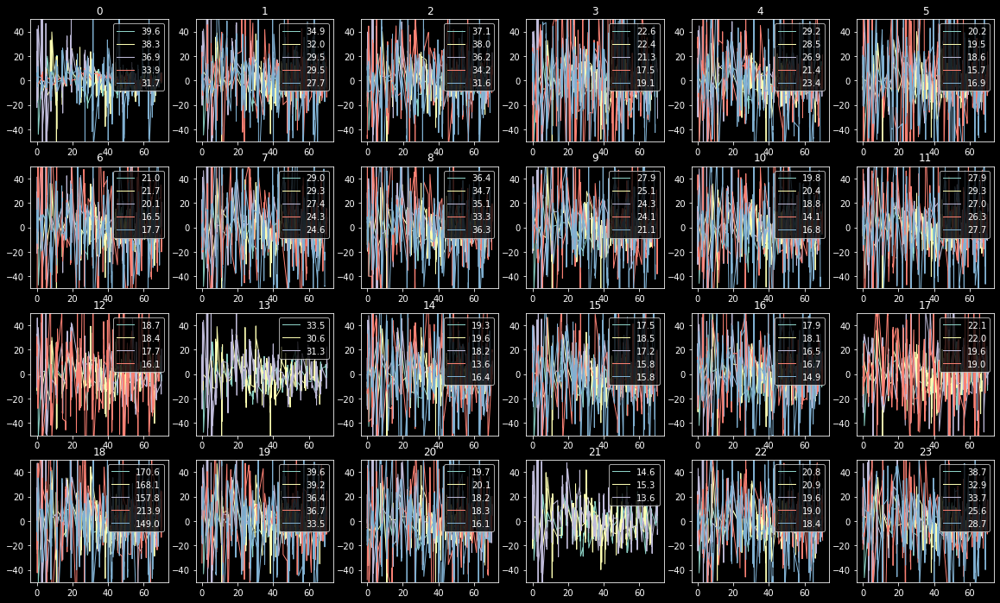

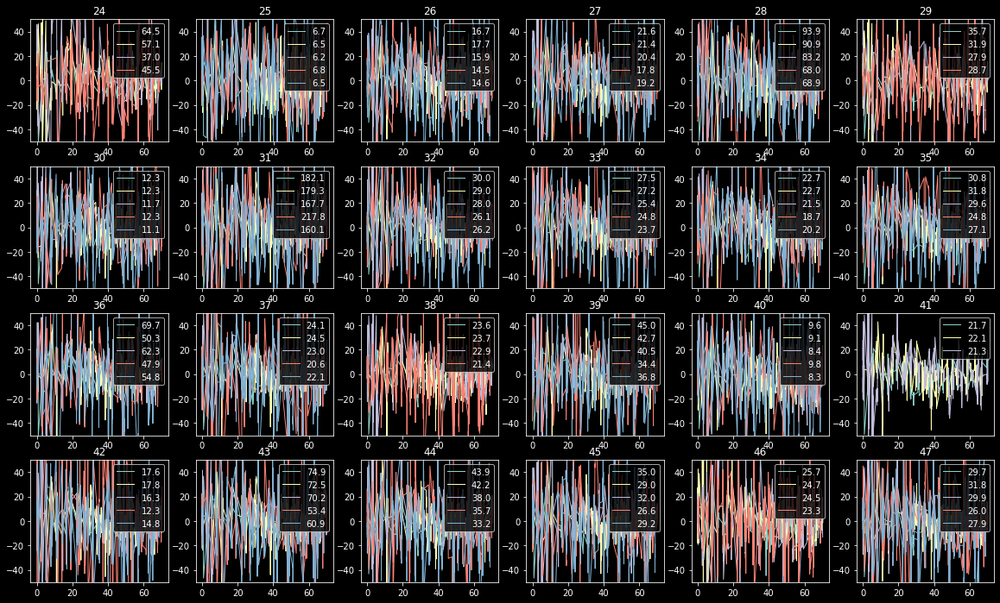

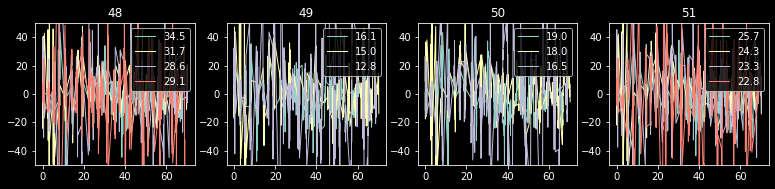

In [80]:
tb.open('w51n_b3_startmodselfcal_phase4_T.startmod.cal')
data_n_4_sm = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()
plotcal(spwids=[0,4,8,12,16], ylim=(-50,50), data=data_n_4_sm)

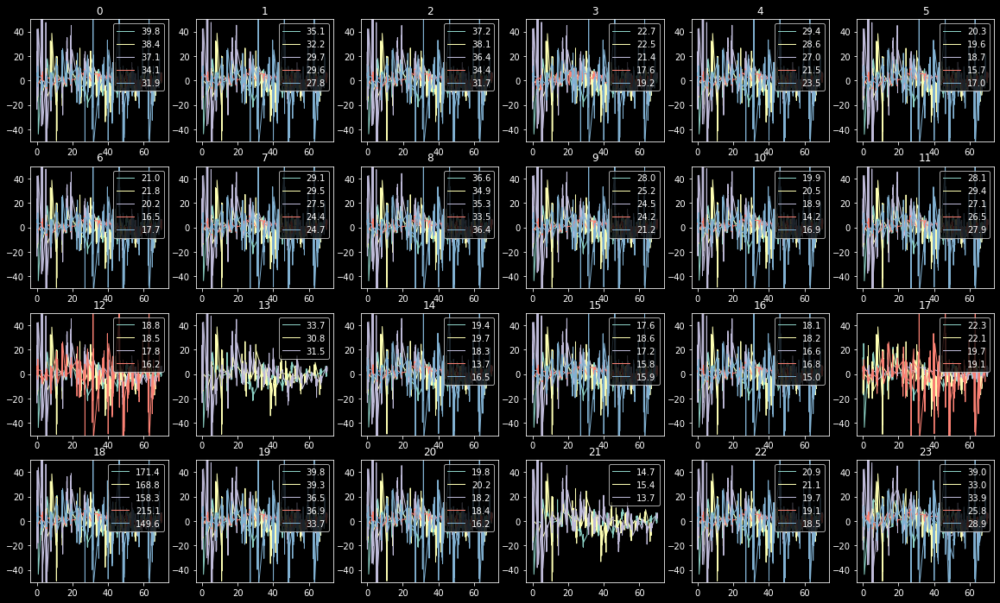

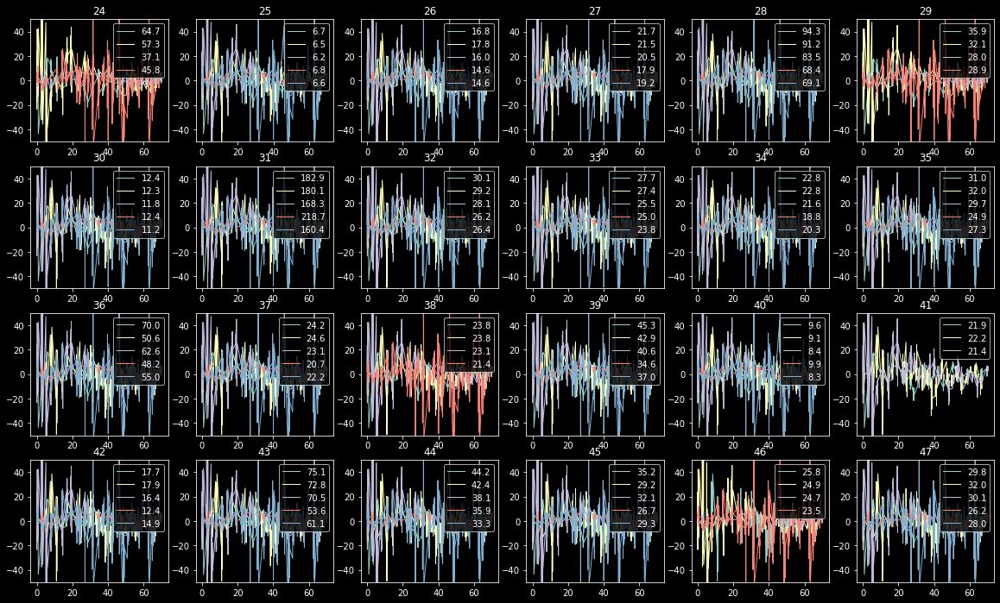

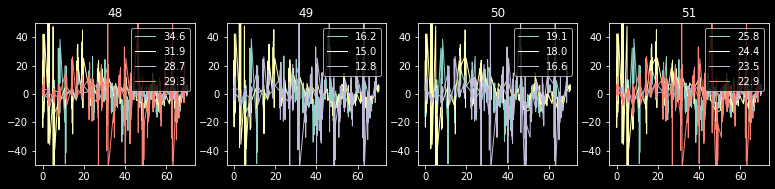

In [81]:
tb.open('w51n_b3_startmodselfcal_phase5_T.startmod.cal')
data_n_5_sm = {col: tb.getcol(col) for col in tb.colnames() if col not in ("WEIGHT",)}
tb.close()
plotcal(spwids=[0,4,8,12,16], ylim=(-50,50), data=data_n_5_sm)